In [ ]:
#---------------------------------------------------------------------------------------------
#                                    bioc_package names                                        
#---------------------------------------------------------------------------------------------
#                                                                                             
# [MoGene-1_1-st] - - - > mogene11sttranscriptcluster      
# [MoGene-1_0-st] - - - > mogene10sttranscriptcluster - - - >  GPL6246
#
#
# Illumina MouseRef-8 v2.0  - - - >  illuminaMousev2  - - - >  GPL6885

In [361]:
source("load_affy.R")
source("load_illum.R")
source("diff_utils.R")
source("MAMA_utils.R")

data_dir <- paste(getwd(), "data", sep="/")

# Young and Short-Term:

### Load Affymetrix:

In [2]:
affy_names <- c("GSE60596", "GSE68646","GSE50789",
               "GSE16790","GSE51885","GSE34773","GSE14202")

#load esets
#affy_esets <- load_affy(affy_names, data_dir)

In [6]:
lapply(affy_esets, dim)

$GSE60596
Features  Samples 
   44891       12 

$GSE68646
Features  Samples 
   24151       15 

$GSE50789
Features  Samples 
   24151       96 

$GSE16790
Features  Samples 
   24151       18 

$GSE51885
Features  Samples 
   24151       27 

$GSE34773
Features  Samples 
   24151       26 

$GSE14202
Features  Samples 
   24151       37

### Load Illumina:

In [3]:
illum_names <- c("GSE49000", "GSE39313")

#load esets
#illum_esets <- load_illum(illum_names, data_dir)

In [8]:
lapply(illum_esets, dim)

$GSE49000
Features  Samples 
   25694       30 

$GSE39313
Features  Samples 
   25694       48

## Differential Expression:

In [4]:
#make genes common
#esets <- c(affy_esets, illum_esets)
gse_names <- c(affy_names, illum_names)

#esets <- commonize(esets)

In [10]:
lapply(esets, dim)

$GSE60596
Features  Samples 
   17235       12 

$GSE68646
Features  Samples 
   20929       15 

$GSE50789
Features  Samples 
   20929       96 

$GSE16790
Features  Samples 
   20929       18 

$GSE51885
Features  Samples 
   20929       27 

$GSE34773
Features  Samples 
   20929       26 

$GSE14202
Features  Samples 
   20929       37 

$GSE49000
Features  Samples 
   18764       30 

$GSE39313
Features  Samples 
   18764       48

GSE60596_CR.55.fat-AL.fat (n significant): 2337 
GSE60596_CR.70.fat-AL.fat (n significant): 1002 
GSE60596_CR.85.fat-AL.fat (n significant): 0 

GSE68646_CR.heart-AL.heart (n significant): 3838 



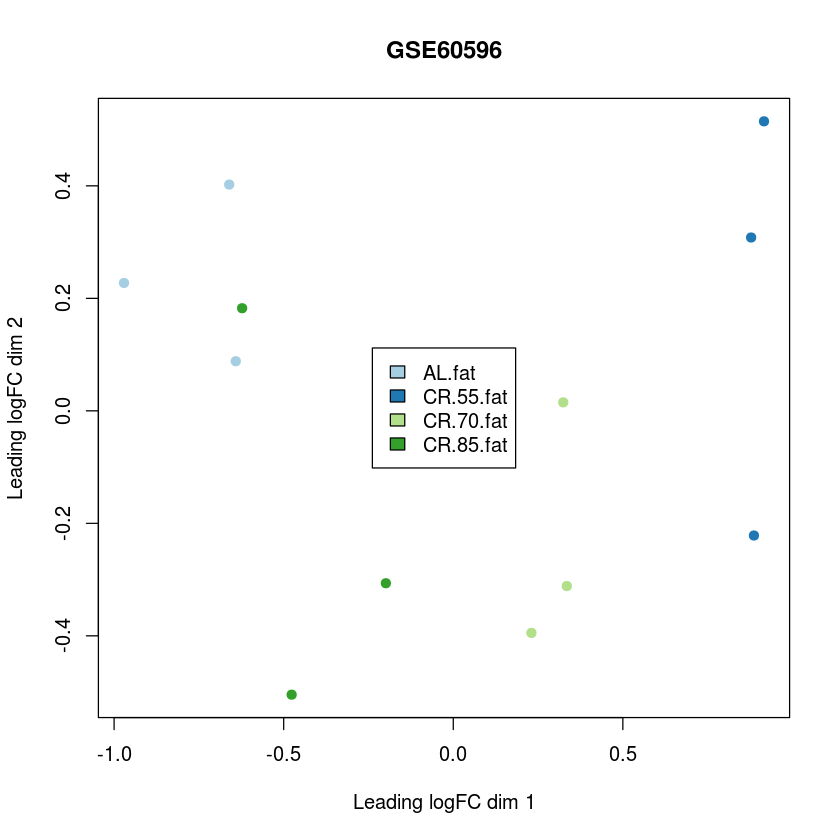

GSE50789_CR.129.liver-AL.129.liver (n significant): 3479 
GSE50789_CR.B6.liver-AL.B6.liver (n significant): 2673 
GSE50789_CR.C3H.liver-AL.C3H.liver (n significant): 2123 
GSE50789_CR.CBA.liver-AL.CBA.liver (n significant): 2676 
GSE50789_CR.DBA.liver-AL.DBA.liver (n significant): 3000 
GSE50789_CR.F1.liver-AL.F1.liver (n significant): 2008 



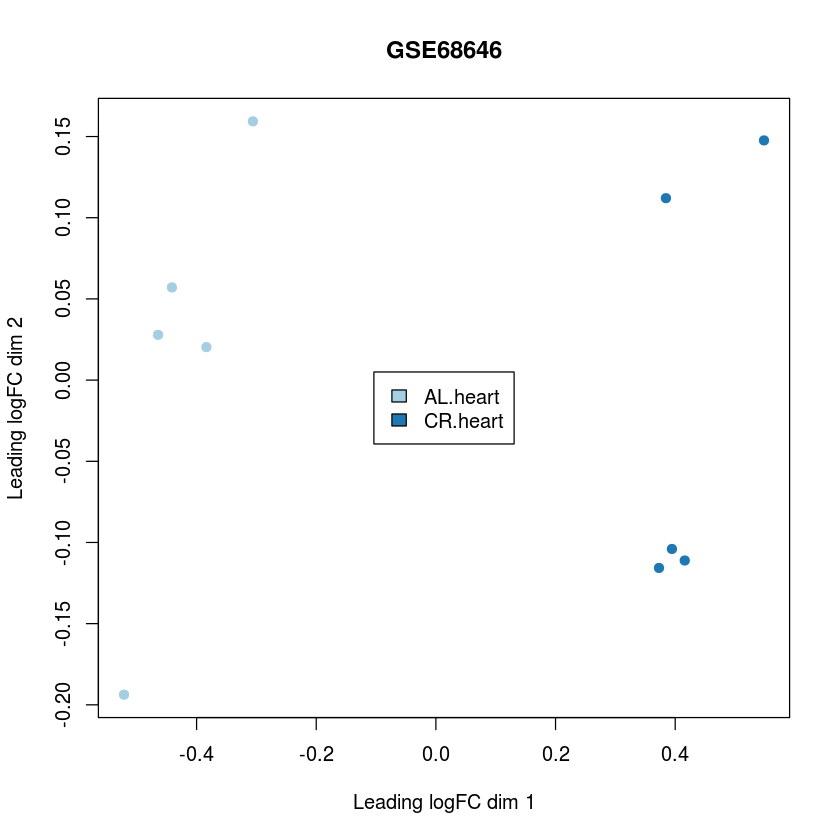

GSE16790_CR.obob.heart-AL.obob.heart (n significant): 887 



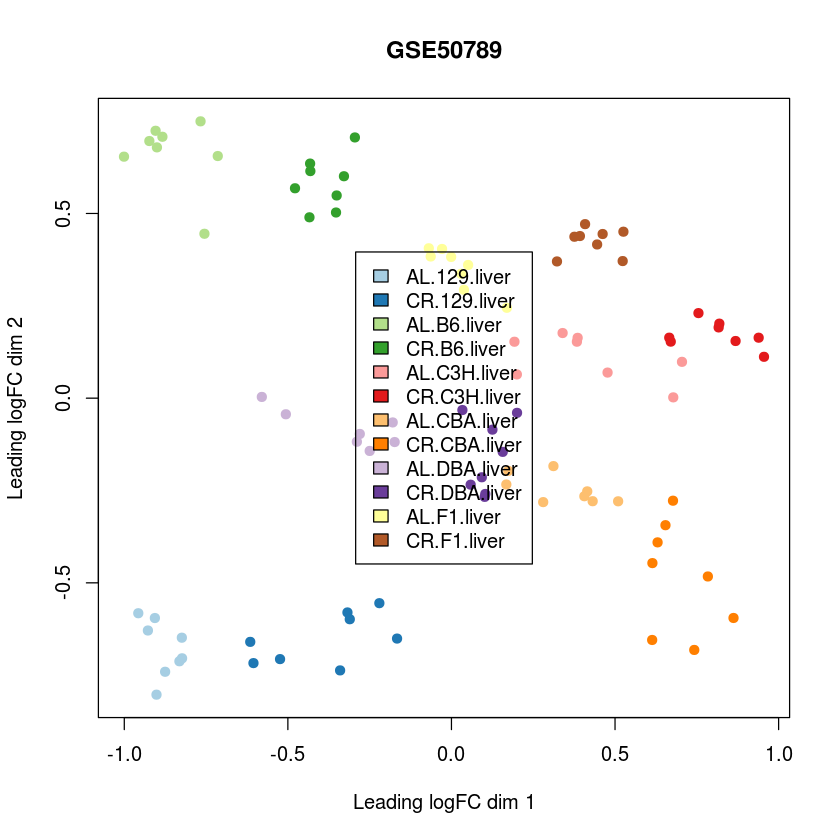

GSE51885_CR.liver-AL.liver (n significant): 0 



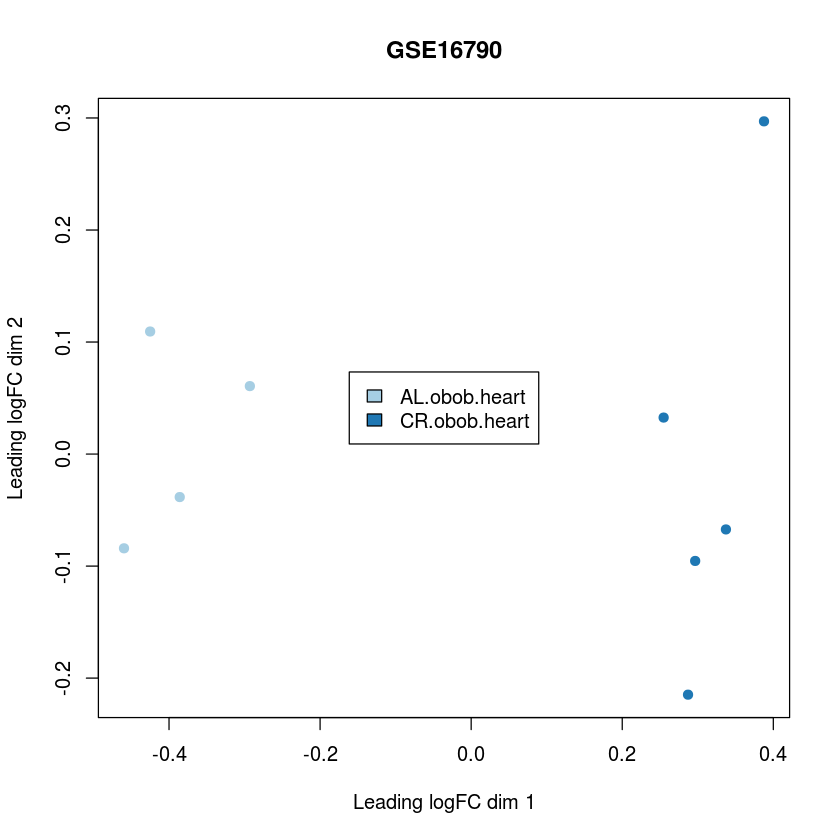

GSE34773_CR.muscle-AL.muscle (n significant): 1388 



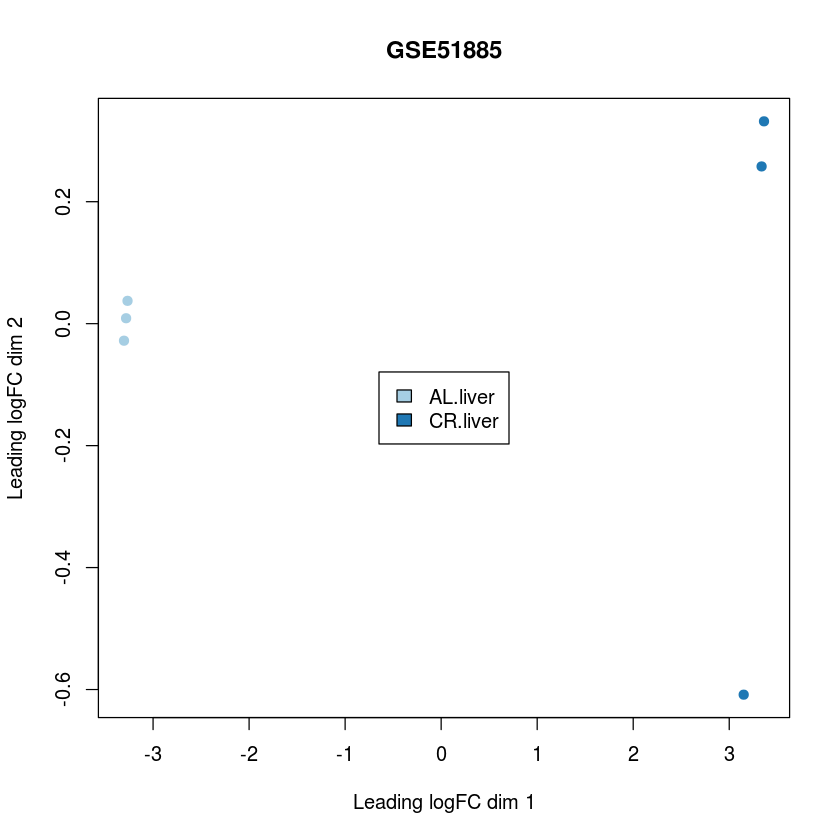

GSE14202_CR.breast-AL.breast (n significant): 97 
GSE14202_CR.EX.breast-AL.breast (n significant): 139 



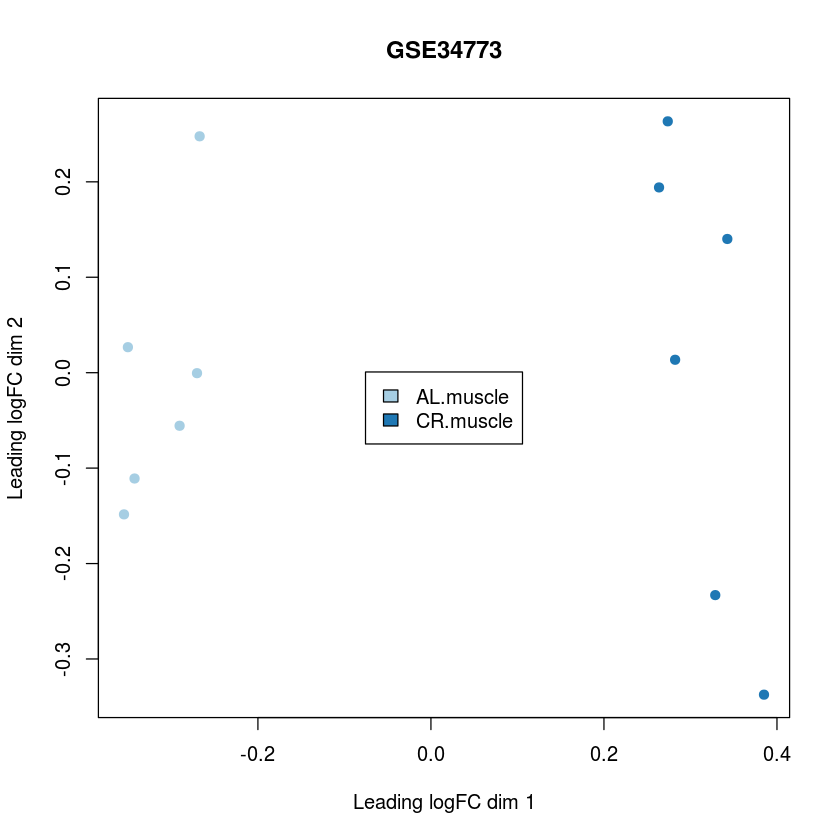

GSE49000_CR.muscle-AL.muscle (n significant): 7685 
GSE49000_CR.liver-AL.liver (n significant): 7571 



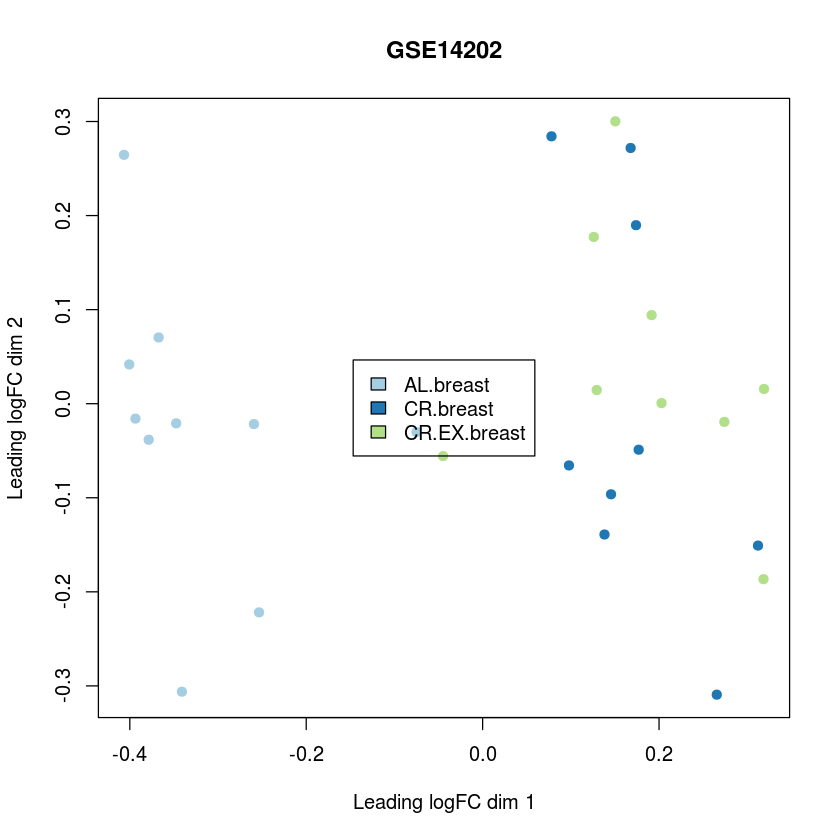

GSE39313_CR.liver-AL.liver (n significant): 3888 
GSE39313_CR.fat-AL.fat (n significant): 17 
GSE39313_CR.muscle-AL.muscle (n significant): 4495 



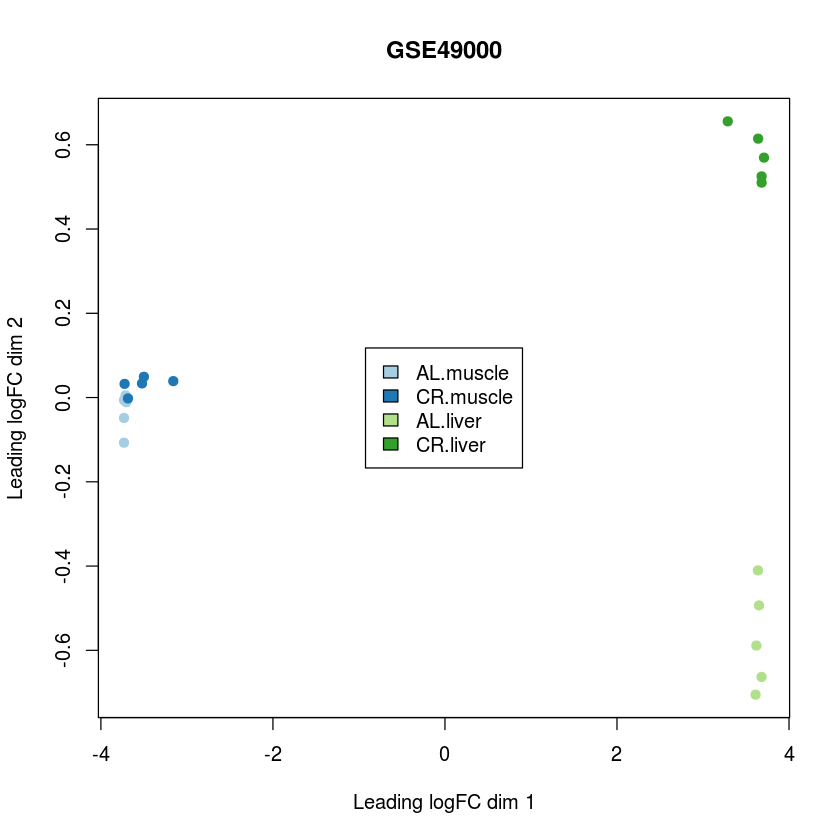

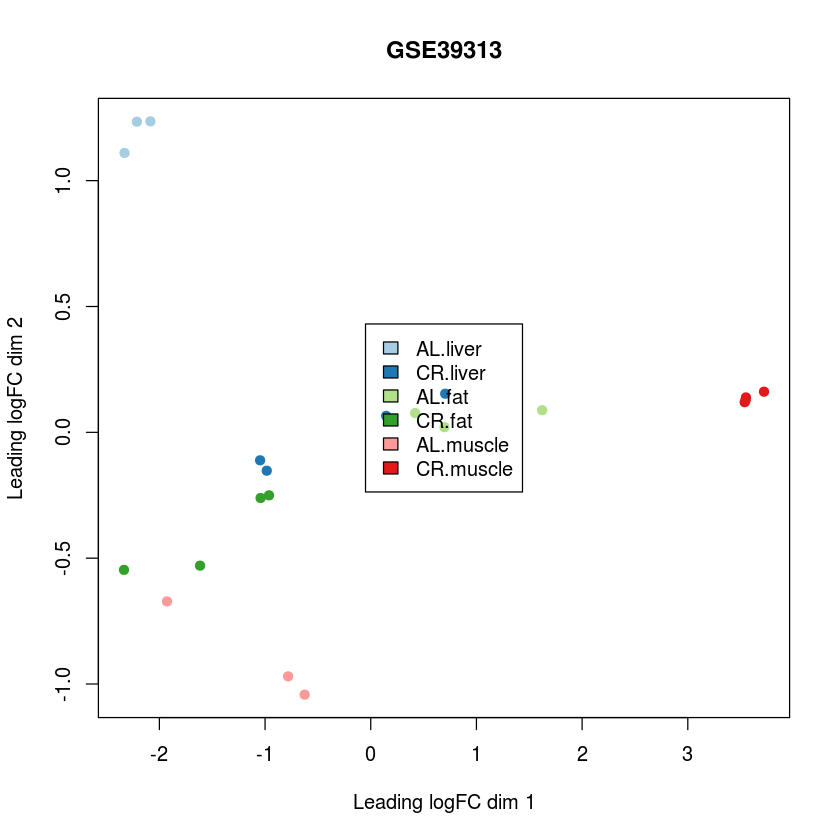

In [11]:
#differential expression
diff_exprs <- diff_expr(esets, data_dir)

In [16]:
lapply(diff_exprs, function(x) dim(x$eset))

$GSE60596
Features  Samples 
   12315       12 

$GSE68646
Features  Samples 
   12315       10 

$GSE50789
Features  Samples 
   12315       96 

$GSE16790
Features  Samples 
   12315        9 

$GSE51885
Features  Samples 
   12315        6 

$GSE34773
Features  Samples 
   12315       12 

$GSE14202
Features  Samples 
   12315       28 

$GSE49000
Features  Samples 
   12315       20 

$GSE39313
Features  Samples 
   12315       21

## Meta-Analysis (MAMA):

### Setup:

In [5]:
# #load diff_exprs
# gse_names <- c("GSE60596", "GSE68646", "GSE49000")
diff_exprs <- load_diff(gse_names, data_dir)

#make MetaArray objects
ma <- make_ma(diff_exprs, sva=F)
ma_sva <- make_ma(diff_exprs, sva=T)

#gene names
gene_names <- featureNames(diff_exprs[[1]]$eset)


#get classes and ebayes, esets, and ebayes
classes <- selectClass(ma, "diet", "factor")
esets <- GEDM(ma)
esets_sva <- GEDM(ma_sva)

ebayes <-get_ebayes(diff_exprs, sva=F)
ebayes_sva <-get_ebayes(diff_exprs, sva=T)

### P-Value Combination:

In [6]:
#Analyses at study level (SVs modeled)
p_stud.sva <- pvalcombination_edit(esets, classes, ebayes_sva)

#summary(p_stud.sva)

     DE     IDD    Loss     IDR     IRR 
4868.00   74.00 6328.00    1.52   56.90 


In [7]:
#Analysis at study level (SVs ignored)
cat("PVAL, study anal (SVs not modeled):\n\n")
p_stud <- pvalcombination_edit(esets, classes, ebayes)

cat("\n\nPVAL, contrast anal (SVs not modeled):\n\n")

#Analysis at contrast level (SVs ignored)
p_cons <- metaMA(ma, "diet", which ="pval")

cat("\n\nPVAL, contrasts anal (effect of SVs removed):\n\n")

#Analysis at contrast level (effect of SVs removed)
p_cons.sva <- metaMA(ma_sva, "diet", which ="pval")

# Why difference at study/contrast level? see https://support.bioconductor.org/p/60556/

PVAL, study anal (SVs not modeled):

     DE     IDD    Loss     IDR     IRR 
4244.00   10.00 7802.00    0.24   64.82 


PVAL, contrast anal (SVs not modeled):

     DE     IDD    Loss     IDR     IRR 
4462.00   81.00 7051.00    1.82   61.68 


PVAL, contrasts anal (effect of SVs removed):

     DE     IDD    Loss     IDR     IRR 
5468.00    9.00 6778.00    0.16   55.39 


In [8]:
pval_genes <- gene_names[p_stud.sva$Meta]

### Effect Size Combination:

In [9]:
#Analyses at study level (SVs modeled)

cat("ES, study anal (SVs modeled):\n\n")
ES_stud.sva <- EScombination_edit(esets, classes, ebayes_sva)

ES, study anal (SVs modeled):

      DE      IDD     Loss      IDR      IRR 
  162.00     2.00 10962.00     1.23    98.56 


In [10]:
#Analysis at study level (SVs ignored)
cat("ES, study anal (SVs not modeled):\n\n")
ES_stud <- EScombination_edit(esets, classes, ebayes)

cat("\n\nES, contrast anal (SVs not modeled):\n\n")

#Analysis at contrast level (SVs ignored)
ES_cons <- metaMA(ma, "diet", which ="ES")

cat("\n\nES, contrasts anal (effect of SVs removed):\n\n")

#Analysis at contrast level (effect of SVs removed)
ES_cons.sva <- metaMA(ma_sva, "diet", which ="ES")

# Why difference at study/contrast level? see https://support.bioconductor.org/p/60556/

ES, study anal (SVs not modeled):

     DE     IDD    Loss     IDR     IRR 
   36.0     0.0 12000.0     0.0    99.7 


ES, contrast anal (SVs not modeled):

      DE      IDD     Loss      IDR      IRR 
  568.00    11.00 10875.00     1.94    95.13 


ES, contrasts anal (effect of SVs removed):

      DE      IDD     Loss      IDR      IRR 
  772.00     0.00 11465.00     0.00    93.69 


In [11]:
#overlap of pval and ES
es_genes <- gene_names[ES_stud.sva$Meta]

# pvalES_genes <- list("sig pval" = pval_genes,
#                      "sig ES" = es_genes)

# draw_venn(pvalES_genes, "pvalES_genes.tiff")

In [12]:
#Implementation from GeneMeta package (contrast level, no SVs)
es2_cons <- ES.GeneMeta(ma, "diet", nperm = 1000)

In [13]:
#overlap of pval and ES2
es2_genes <- rownames(es2_cons$ScoresFDR$two.sided)[es2_cons$ScoresFDR$two.sided[, "FDR"] < 0.02]

# pvalES2_genes <- list("sig pval" = pval_genes,
#                       "sig ES2" = es2_genes)

# draw_venn(pvalES2_genes, "pvalES2_genes.tiff")

# #overlap of ES and ES2
# ES.ES2_genes <- list("sig ES" = es_genes,
#                      "sig ES2" = es2_genes)

# draw_venn(ES.ES2_genes, "ES.ES2_genes.tiff")

### Similarity of Ordered Gene Lists (SOGL):

In [29]:
SOGL.res <- performSOGL(ma_sva, varname = "diet", test = "FCH",
                        B = 100, which=c("score", "empirical"), min.weight = 1e-05, two.sided = TRUE )

Processing data...Tuning alpha..Significance and genes...

ERROR: Error in x[, 2]: incorrect number of dimensions


In [30]:
plot(SOGL.res, "alpha selection")
plot(SOGL.res, "density")
plot(SOGL.res, "empirical CI")

ERROR: Error in plot(SOGL.res, "alpha selection"): error in evaluating the argument 'x' in selecting a method for function 'plot': Error: object 'SOGL.res' not found



ERROR: Error in plot(SOGL.res, "density"): error in evaluating the argument 'x' in selecting a method for function 'plot': Error: object 'SOGL.res' not found



ERROR: Error in plot(SOGL.res, "empirical CI"): error in evaluating the argument 'x' in selecting a method for function 'plot': Error: object 'SOGL.res' not found



### Rank Product:

In [14]:
rp <- RankProduct(ma_sva, "diet", num.perm = 1500)

Loading required package: RankProd


 The data is from  20 different origins 
 
Rank Product analysis for two-class case 
 
Starting  1500 permutations... 
Computing pfp... 
Table1: Genes called significant under class1 < class2 

Table2: Genes called significant under class1 > class2 



In [15]:
rp_genes <- unique(c(rownames(rp$Table1), rownames(rp$Table2)))
length(rp_genes)

[1] 3945

In [185]:
#overlap of rp and pval
rp.pval_genes <- list("rp" = rp_genes,
                      "sig pval" = pval_genes)

draw_venn(rp.pval_genes , "rp.pval_genes.tiff")

#overlap of rp and ES
rp.ES_genes <- list("rp" = rp_genes,
                    "sig ES" = es_genes)

draw_venn(rp.ES_genes, "rp.ES_genes.tiff")

#overlap of rp and ES2
rp.ES2_genes <- list("rp" = rp_genes,
                     "sig ES2" = es2_genes)

draw_venn(rp.ES2_genes, "rp.ES2_genes.tiff")

### Rank Merging:

In [379]:
source("load_affy.R")
source("load_illum.R")
source("diff_utils.R")
source("MAMA_utils.R")

data_dir <- paste(getwd(), "data", sep="/")

In [380]:
#obtain top 250 up/down-regulated genes(wrapper for RankMerging from GeneExpressionSignature)
#PRL = prototype ranked list

prl_top <- merge_ranks(diff_exprs, n=250)

In [381]:
#obtain full PRL
prl_full <- merge_ranks(diff_exprs)

In [405]:
#sanity check
t_tab <- data.frame("t-stat" = ES_cons.sva$TestStatistic)  #effect size meta t-statistic
row.names(t_tab) <- ES_cons.sva$gene.names

t_tab[names(prl_full), "prl"] <- prl_full  #add ranks from prl

#average t-statistic for bottom/top ranks from prl
mean(t_tab[tail(names(prl_full), 300), "t.stat"])  #should be negative
mean(t_tab[head(names(prl_full), 300), "t.stat"])  #should be positive

[1] -1.745558

[1] 1.163654

## Combining MAMA Results:

In [92]:
# type:                    1            1               3         5       7
lists <- join.DEG_edit(p_stud.sva, ES_stud.sva, es2_cons$ScoresFDR, rp, prl_top,
                       genenames = rownames(GEDM(ma)[[1]]),
                       type=c(1, 1, 3, 5, 7),
                       cutoff=0.05)

names(lists)<-c("PvalCom", "ESCom","ESCom2", "RankProduct", "MergeRanks")

# • 1for functions: pvalcombination, pvalcombination.paired, EScombination or EScombination.paired
# • 2for function zScores
# • 3for function ScoresFDR
# • 4for function performSOGL
# • 5for function topGene
# • 6for function z.stat
# • 7for function MAP.genes or merge(ranks)

In [93]:
summary(lists)

            Length Class  Mode     
PvalCom     4868   -none- character
ESCom        162   -none- character
ESCom2      1265   -none- character
RankProduct 3945   -none- character
MergeRanks   500   -none- character

In [94]:
MAT<-make.matrix(lists)
n.met <- apply(MAT,1,sum)

In [95]:
#number of genes found by x or more methods
lapply(1:5, function(x) length(n.met[n.met >= x]))

[[1]]
[1] 6912

[[2]]
[1] 2948

[[3]]
[1] 753

[[4]]
[1] 105

[[5]]
[1] 22

In [96]:
#number of genes in common between each method
TAB<-conting.tab(lists)
TAB

,PvalCom,ESCom,ESCom2,RankProduct,MergeRanks
PvalCom,NA,162,693,2163,439
ESCom,162,NA,48,90,85
ESCom2,693,48,NA,886,92
RankProduct,2163,90,886,NA,199
MergeRanks,439,85,92,199,NA


In [97]:
#comparison to expected if methods are random

#generate TABs from random sampling
TABs_rs <- random_TAB(MAT)
#mean and sd of TABs from random sampling
TABs_rs_mean <- apply(simplify2array(TABs_rs), 1:2, mean)
TABs_rs_sd <- apply(simplify2array(TABs_rs), 1:2, sd)

# (actual - expected) / SD:
round((TAB - TABs_rs_mean) / TABs_rs_sd)

# positive values --> more similar than expect by chance
# negative values --> less similar than expect by chance

,PvalCom,ESCom,ESCom2,RankProduct,MergeRanks
PvalCom,NA,8,-14,-33,9
ESCom,8,NA,4,0,22
ESCom2,-14,4,NA,10,0
RankProduct,-33,0,10,NA,-8
MergeRanks,9,22,0,-8,NA


In [245]:
length(row.names((MAT)[n.met>=4,]))

[1] 105

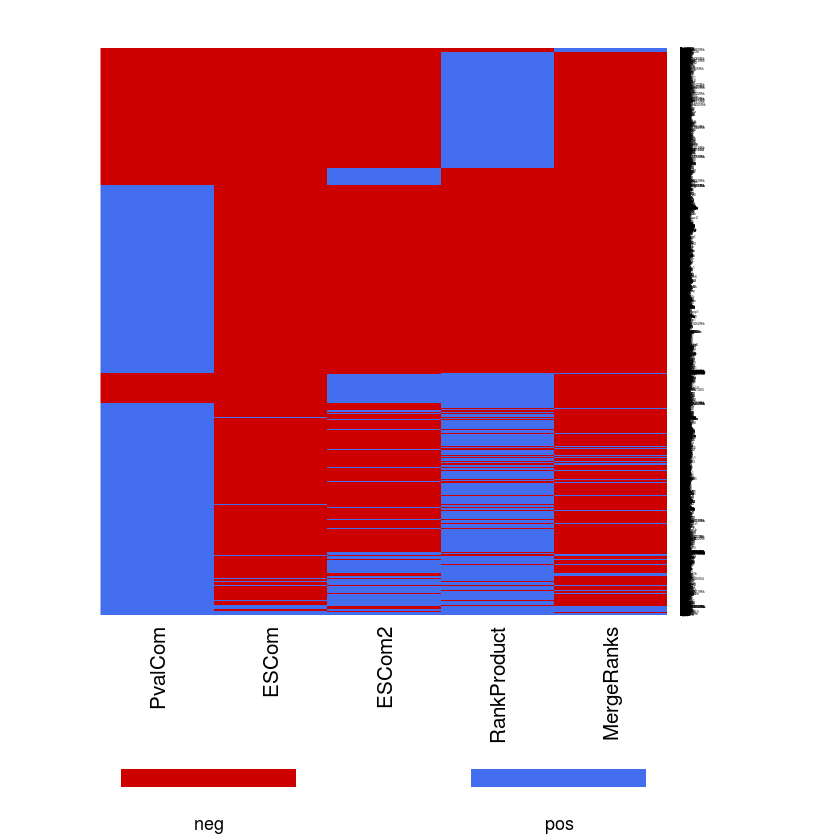

In [41]:
#heatmap
MAT_ord <- MAT[order(rowSums(MAT),decreasing=T),]
metaheat(MAT_ord, legend=1, col=c("red3", "royalblue2"))

In [ ]:
#save genes in 4+ methods (up/dn based on ES meta t-statistic)

t_stats <- ES_cons.sva$TestStatistic  #effect size meta t-statistic
names(t_stats) <- ES_cons.sva$gene.names

CR_genes <- t_stats[row.names(MAT[n.met>=4,])]
saveRDS(CR_genes, "CR_genes.rds")

## Old and Long-Term:

### Affymetrix:

In [ ]:
gse_names <- c("GSE61233", "GSE11291","GSE4786", "GSE6323")

### Illumina:

In [ ]:
gse_names <- c("GSE62194","GSE46895", "GSE40936", "GSE36285", 
               "GSE52825", "GSE40977", "GSE23218", "GSE11845")